# Oppgave - Matplotlib

1. Funksjonen: ```def show_images(amount)``` viser et valgfritt antall bilder ved å kalle den med ulike argumenter (**amount** er et argument til funksjonen).
   - Kopier funksjonen inn i denne filen
   - Last inn bildene som ligger i `foreground_segmentation_images` og `foreground_segmentation_labels` til nye variabler ```images``` og ```labels``` i denne filen
   - Test funksjonen ved å kalle den med ulike tall fra 1–9

2. Endre funksjonen slik at den alltid viser 2 bilder mer enn **amount**
   - Hva kan gå galt, og hvordan kan vi løse det?

3. Lag en mappe i `data`: `data/my_images`
   - Legg til noen valgfrie bilder
   - Last inn bildene til en variabel ```my_images```

4. Lag din egen versjon av funksjonen
   - Vis ulike størrelser; endre f.eks.: ```plt.figure(figsize=(16, 4), dpi=300)```
   - Endre tittel/tekst, skriftfarge og størrelse på bildetekstene
   - (Valgfritt) Legg til flere forbedringer (f.eks. tilfeldig utvalg av bilder, sortering, lagre figur til fil)


Loaded IMG_4495.png from ./data/foreground_segmentation_images
Loaded IMG_4496.png from ./data/foreground_segmentation_images
Loaded IMG_4501.png from ./data/foreground_segmentation_images
Loaded IMG_4503.png from ./data/foreground_segmentation_images
Loaded IMG_4506.png from ./data/foreground_segmentation_images
Loaded IMG_4511.png from ./data/foreground_segmentation_images
Loaded IMG_4515.png from ./data/foreground_segmentation_images
Loaded IMG_4520.png from ./data/foreground_segmentation_images
Loaded IMG_4524.png from ./data/foreground_segmentation_images
Loaded IMG_4528.png from ./data/foreground_segmentation_images
Loaded IMG_4531.png from ./data/foreground_segmentation_images
Loaded IMG_4532.png from ./data/foreground_segmentation_images
Loaded IMG_4534.png from ./data/foreground_segmentation_images
Loaded IMG_4535.png from ./data/foreground_segmentation_images
Loaded IMG_4538.png from ./data/foreground_segmentation_images
Loaded IMG_4541.png from ./data/foreground_segmentation

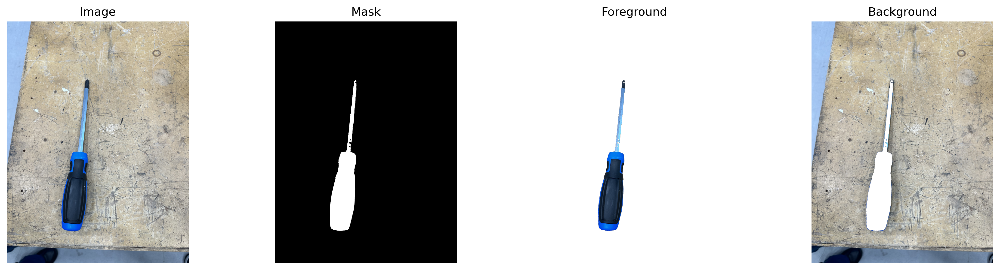

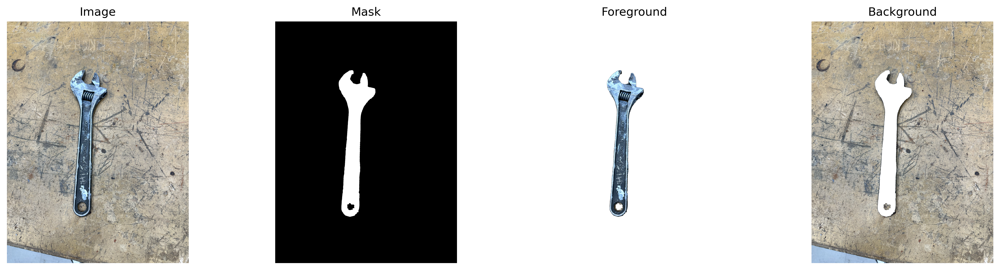

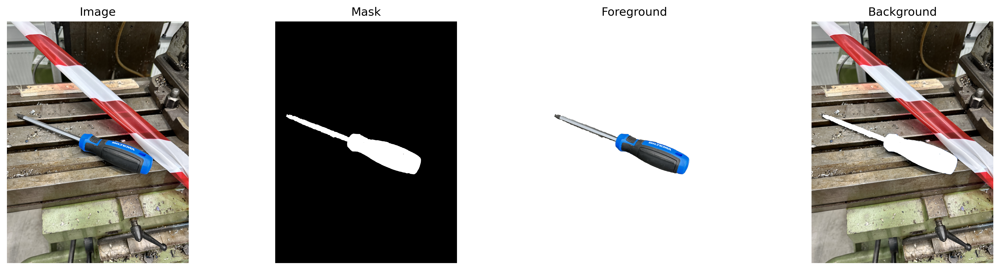

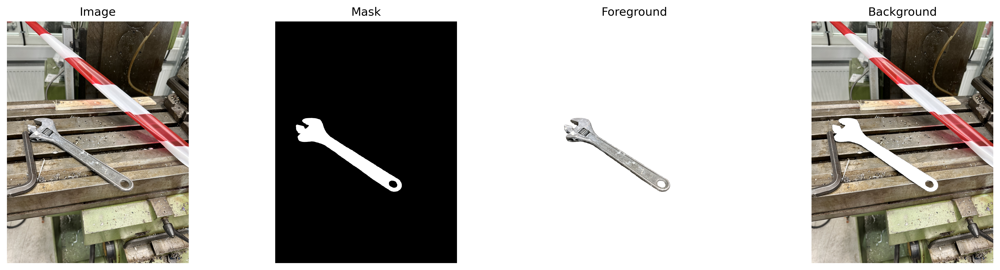

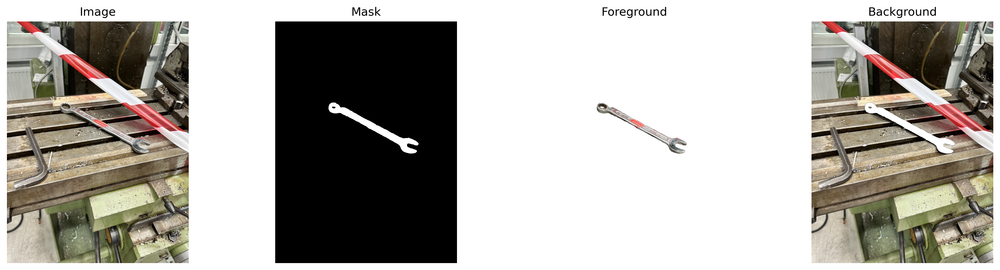

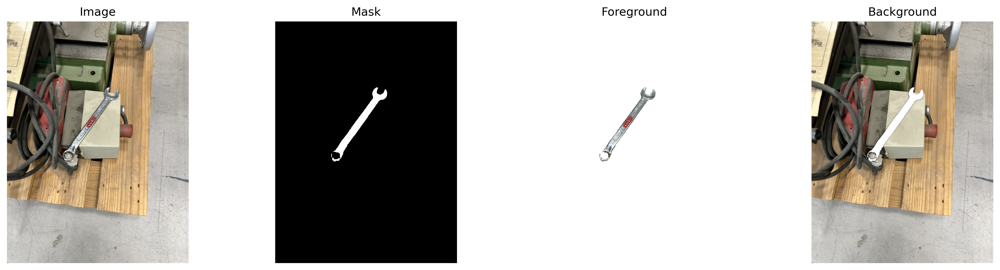

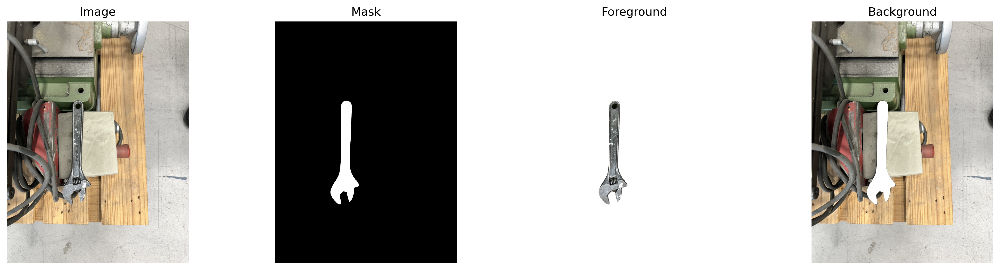

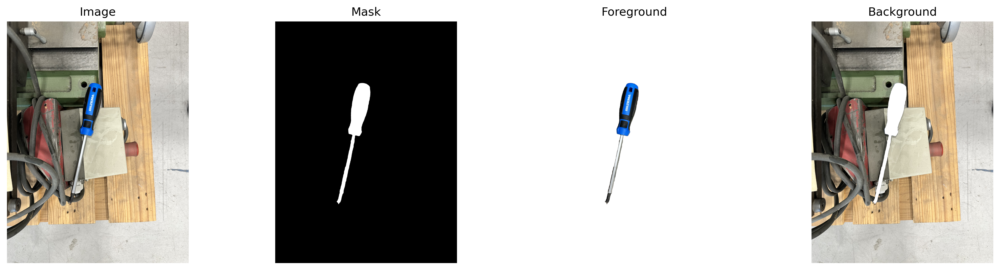

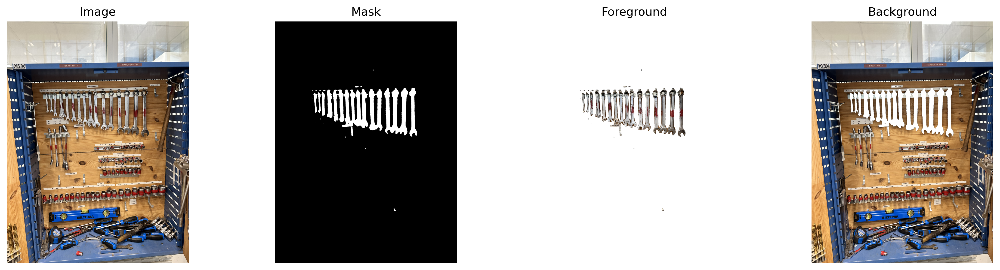

[[[159 196 241 255]
  [158 195 240 255]
  [159 196 241 255]
  ...
  [227 211 177 255]
  [230 214 180 255]
  [229 213 179 255]]

 [[160 197 242 255]
  [161 198 243 255]
  [163 200 245 255]
  ...
  [229 213 179 255]
  [224 208 174 255]
  [214 198 164 255]]

 [[160 197 242 255]
  [162 199 244 255]
  [164 201 246 255]
  ...
  [217 201 167 255]
  [213 197 163 255]
  [204 188 154 255]]

 ...

 [[138 164 199 255]
  [135 161 196 255]
  [133 159 194 255]
  ...
  [  1   8  24 255]
  [  2   9  25 255]
  [  2   9  25 255]]

 [[137 162 195 255]
  [137 162 195 255]
  [132 157 190 255]
  ...
  [  2   9  25 255]
  [  1   8  24 255]
  [  0   7  23 255]]

 [[132 157 190 255]
  [140 165 198 255]
  [137 162 195 255]
  ...
  [  3  10  26 255]
  [  0   7  23 255]
  [  0   5  21 255]]]


In [25]:
import math
import matplotlib.pyplot as plt
import os, glob
from PIL import Image, ImageChops
import numpy as np

# Bruke bilder som er lagret lokalt på på "data" mappen
image_folder = "./data/foreground_segmentation_images"
label_folder = "./data/foreground_segmentation_labels"

def load_images_from_folder(folder: str) -> list[Image.Image]:
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            
            img = Image.open(os.path.join(folder, filename))
            images.append(img)
            print(f"Loaded {filename} from {folder}")

    print(f"Total images loaded from {folder}: {len(images)}\n")
    return images

images = load_images_from_folder(image_folder)
labels = load_images_from_folder(label_folder)
n_images = len(images)

assert n_images == len(labels), f"{len(images)=}, {len(labels)=}" # Sjekke at vi har like mange bilder og labels

print(f"Loaded {n_images} images and labels from local folders")

# --- Hjelper: last bilder fra mappe ---
def _list_image_paths(folder):
    exts = ("*.png","*.jpg","*.jpeg","*.bmp","*.tif","*.tiff","*.webp")
    paths = []
    for ext in exts:
        paths += glob.glob(os.path.join(folder, ext))
    return sorted(paths)

def load_pairs(images_dir, labels_dir):
    """
    Laster og parer bilder og masker etter felles filnavn (uten endelse).
    Returnerer to lister: images (PIL.Image RGB) og labels (PIL.Image L)
    """
    img_paths = _list_image_paths(images_dir)
    lbl_paths = _list_image_paths(labels_dir)

    # lag oppslagskart på fil-stem
    def stem(p): 
        return os.path.splitext(os.path.basename(p))[0]

    lbl_map = {stem(p): p for p in lbl_paths}

    images, labels = [], []
    for ip in img_paths:
        s = stem(ip)
        if s in lbl_map:
            im = Image.open(ip).convert("RGB")
            m  = Image.open(lbl_map[s]).convert("L")
            # sikre samme størrelse
            if m.size != im.size:
                m = m.resize(im.size, resample=Image.NEAREST)
            # valgfritt: tving masken til 0/255
            # m = m.point(lambda v: 255 if v >= 128 else 0).convert("L")
            images.append(im)
            labels.append(m)
    return images, labels

def show_images(amount, images, labels):
    """
    Viser for hvert par: [Image, Mask, Foreground, Background].
    amount klippes til gyldig område.
    """
    if amount <= 0:
        raise ValueError("amount må være >= 1")
    if not images or not labels:
        raise RuntimeError("Tom `images` eller `labels`.")

    n = min(amount, len(images), len(labels))
    for image, mask in zip(images[:n], labels[:n]):
        img_rgba = image.convert("RGBA")
        m = mask.convert("L")  # 0–255

        # Foreground = bare motiv (masken som alpha)
        fg = Image.new("RGBA", img_rgba.size, (0, 0, 0, 0))
        fg.paste(img_rgba, (0, 0), m)

        # Background = bakgrunnen (inverter masken)
        m_inv = ImageChops.invert(m)
        bg = Image.new("RGBA", img_rgba.size, (0, 0, 0, 0))
        bg.paste(img_rgba, (0, 0), m_inv)

        data_to_show = [image, m, fg, bg]
        data_labels = ["Image", "Mask", "Foreground", "Background"]

        plt.figure(figsize=(16, 4), dpi=300)
        for i, (d, t) in enumerate(zip(data_to_show, data_labels), 1):
            plt.subplot(1, len(data_to_show), i)
            if t == "Mask":
                plt.imshow(np.array(d), cmap="gray", vmin=0, vmax=255)
            else:
                plt.imshow(d)
            plt.axis("off")
            plt.title(t, fontsize=12)
        plt.tight_layout()
        plt.show()

# --- Bruk ---
vise_antall_bilder = 9
show_images(vise_antall_bilder, images, labels)

# Print første bilde som numpy-array (RGBA)
print(np.array(images[0].convert("RGBA")))

